In [2]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 23 kB/s 
     |████████████████████████████████| 6.6 MB 21.0 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.


     |████████████████████████████████| 274 kB 5.4 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=8bb17b7472242e7613802506dc2ec97895b23f9a9141bb972857269b56c7cfc1
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-hqisiunx
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-hqisiunx
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=263924 sha256=609e01a18a61c3130e5ee1335fa8e46a05312f309a91f1d4ac6fb35fae01aeea
  Stored in directory: /tmp/pip-ephem-wheel-cache-ehg788bb/wheels/e2/6b/1d/344ac773c7495ea0b85eb228bc66daec7400a143a92d36b7b1
Successfully built p

In [5]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


In [1]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [2]:
!curl -L "{https://app.roboflow.com/ds/2TQS61lXuX?key=F3s4mNRQiv}" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0   1919      0 --:--:-- --:--:-- --:--:--  1919
100 4866k  100 4866k    0     0  8784k      0 --:--:-- --:--:-- --:--:-- 8784k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/047_jpeg.rf.3034e58bb19aecd137f9cf9047120078.jpg  
 extracting: test/065_jpeg.rf.45648d2714feecbbb46d000cd9fd67ca.jpg  
 extracting: test/071_jpeg.rf.1a5ad7115ad5ca185f31a8e48a842888.jpg  
 extracting: test/073_jpeg.rf.5403ea5ea98aed704f539539ec7c99cf.jpg  
 extracting: test/087_jpeg.rf.cdf2059cf785a765b367308538d1e18f.jpg  
 extracting: test/096_jpeg.rf.8c52f4e4e5669579c875e839138126b0.jpg  
 extracting: test/097_jpeg.rf.0138d475b2810ecc43059461c1dd9e43.jpg  
 extracting: test/099_jpeg.rf.81fe9ff7d40d73061fecc8af59daa300.jpg  
 extracting: t

In [3]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [12/28 09:39:44 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/28 09:39:44 d2.data.datasets.coco]: Loaded 221 images in COCO format from /content/train/_annotations.coco.json


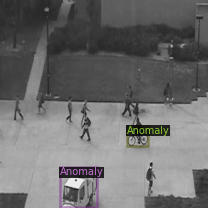

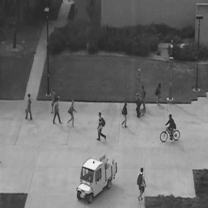

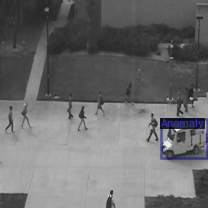

In [4]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [5]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [6]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 100
cfg.SOLVER.MAX_ITER = 150 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (100, 150)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/28 09:40:31 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:34, 12.2MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_p

[12/28 09:41:11 d2.engine.train_loop]: Starting training from iteration 0
[12/28 09:42:56 d2.utils.events]:  eta: 0:11:48  iter: 19  total_loss: 2.357  loss_cls: 1.386  loss_box_reg: 0.939  loss_rpn_cls: 0.048  loss_rpn_loc: 0.007  time: 5.2338  data_time: 0.0352  lr: 0.000191  max_mem: 7213M
[12/28 09:44:38 d2.utils.events]:  eta: 0:09:59  iter: 39  total_loss: 1.293  loss_cls: 0.385  loss_box_reg: 0.842  loss_rpn_cls: 0.024  loss_rpn_loc: 0.006  time: 5.1615  data_time: 0.0170  lr: 0.000391  max_mem: 7213M
[12/28 09:46:20 d2.utils.events]:  eta: 0:08:11  iter: 59  total_loss: 0.767  loss_cls: 0.127  loss_box_reg: 0.620  loss_rpn_cls: 0.006  loss_rpn_loc: 0.006  time: 5.1351  data_time: 0.0191  lr: 0.000590  max_mem: 7213M
[12/28 09:48:04 d2.utils.events]:  eta: 0:06:23  iter: 79  total_loss: 0.441  loss_cls: 0.064  loss_box_reg: 0.372  loss_rpn_cls: 0.001  loss_rpn_loc: 0.005  time: 5.1507  data_time: 0.0178  lr: 0.000790  max_mem: 7213M
[12/28 09:49:46 d2.utils.events]:  eta: 0:04:3

In [8]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 748), started 0:01:04 ago. (Use '!kill 748' to kill it.)

<IPython.core.display.Javascript object>

In [9]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [12/28 10:06:08 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/28 10:06:08 d2.data.datasets.coco]: Loaded 32 images in COCO format from /content/test/_annotations.coco.json
[12/28 10:06:08 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|  Anomaly   | 0            |  Anomaly   | 43           |
|            |              |            |              |
|   total    | 43           |            |              |
[12/28 10:06:08 d2.data.common]: Serializing 32 elements to byte tensors and concatenating them all ...
[12/28 10:06:08 d2.data.common]: Serialized dataset takes 0.01 MiB
[12/28 10:06:08 d2.evaluation.evaluator]: Start inference on 32 images
[12/28 10:06:14 d2.evaluation.evaluator]: Inference done 11/32. 0.5820 s / img. ETA=0:00:12
[12/28 10:06:20 d2.evaluation.evaluator]: 

OrderedDict([('bbox',
              {'AP': 57.62345972814556,
               'AP-Anomaly': 57.62345972814556,
               'AP50': 77.54363397051559,
               'AP75': 72.89800408612291,
               'APl': nan,
               'APm': 63.01322118274546,
               'APs': 33.23434962543874})])

In [10]:
%ls ./output/

coco_instances_results.json                        last_checkpoint
events.out.tfevents.1640684437.f0a025011e1c.422.0  metrics.json
instances_predictions.pth                          model_final.pth


In [11]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

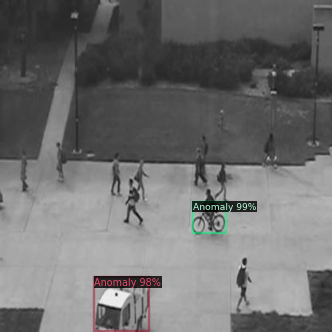

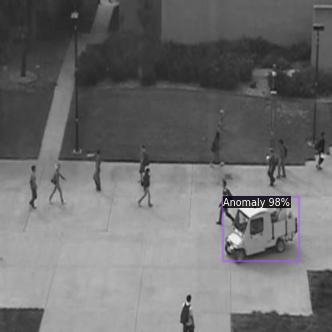

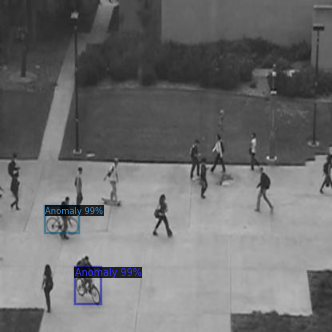

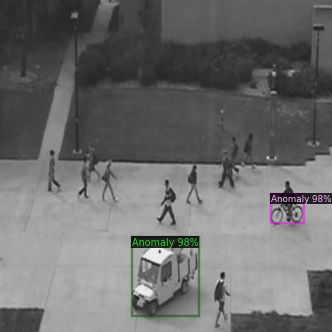

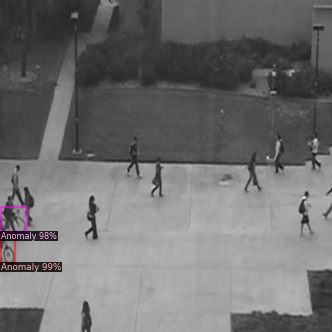

...

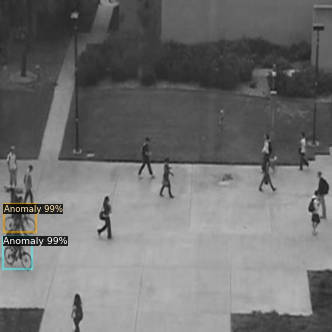

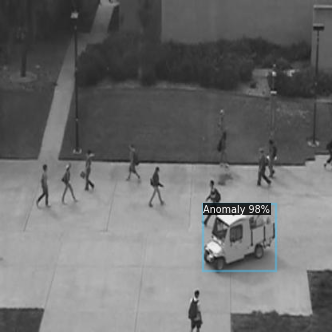

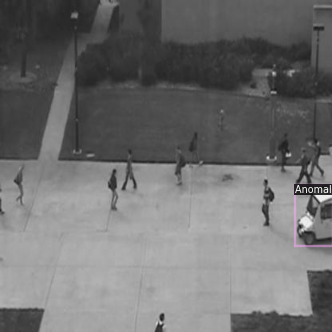

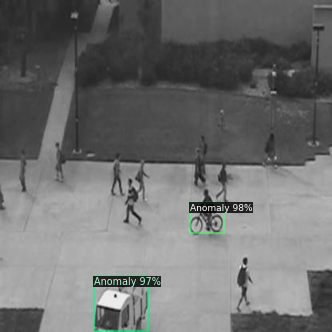

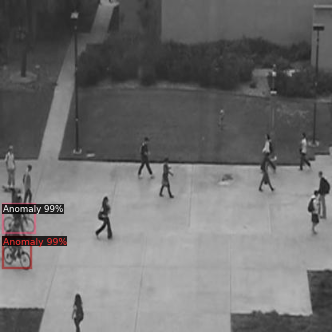

In [12]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
